<a href="https://colab.research.google.com/github/durgasreeborra/topic-modeling-on-news-articles/blob/main/Copy_of_Welcome_To_Colaboratory.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Project Title : TOPIC MODELLING ON NEWS ARTICLES**

#**Contribution-Team**


**Team Member 1-Jashwanth Vemuri**

**Team Member 2-Bhaskar purimitla**

**Team Member 3-Meghana Kantamneni**

**Team Member 4-Durgasree Borra**


#**Problem Description**:
In this project your task is to identify major themes/topics across a collection of BBC news articles. You can
use clustering algorithms such as Latent Dirichlet Allocation (LDA), Latent Semantic Analysis (LSA) etc



#**Data Description:**
The dataset contains a set of news articles for each major segment consisting of business, entertainment,
politics, sports, and technology.



**In this project, you are required to do.**

• Create an aggregate dataset of all the news articles and perform topic modelling on the dataset.

• Verify whether these topics correspond to the different tags available

#**Meghana Workspace**


**Connecting To Drive**

In [ ]:
import os
from google.colab import drive
drive.mount("/content/drive/")

Mounted at /content/drive/


**Data Ingestion**

In [ ]:

data = {}
categories = ["business", "entertainment", "politics", "sport", "tech"]

for category in categories:
    category_data = []
    category_dir = os.path.join("/content/drive/MyDrive/data/Temp", category)

    file_list = os.listdir(category_dir)
    for file_name in file_list:
        with open(os.path.join(category_dir, file_name), 'r', encoding='iso-8859-1') as file:
            text = file.read()
            category_data.append(text)
    data[category] = category_data
data

{'business': ['India widens access to telecoms\n\nIndia has raised the limit for foreign direct investment in telecoms companies from 49% to 74%.\n\nCommunications Minister Dayanidhi Maran said that there is a need to fund the fast-growing mobile market. The government hopes to increase the number of mobile users from 95 million to between 200 and 250 million by 2007. "We need at least $20bn (Â£10.6bn) in investment and part of this has to come as foreign direct investment," said Mr Maran. The decision to raise the limit for foreign investors faced considerable opposition from the communist parties, which give crucial support to the coalition headed by Prime Minister Manmohan Singh. Potential foreign investors will however need government approval before they increase their stake beyond 49%, Mr Maran said. Key positions, such as those of chief executive, chief technology officer and chief financial officer are to be held by Indians, he added.\n\nAnalysts and investors have welcomed the

**Data Exploration**

In [ ]:
import os
import pandas as pd

# Create an empty dictionary to store data categorized by different categories.
data = {}
categories = ["business", "entertainment", "politics", "sport", "tech"]

# Define a dictionary to store exploration results.
exploration_results = {}
all_articles=[]

# Loop through each category.
for category in categories:
    category_data = []
    category_dir = os.path.join("/content/drive/MyDrive/data/Temp", category)

    file_list = os.listdir(category_dir)
    for file_name in file_list:
        with open(os.path.join(category_dir, file_name), 'r', encoding='iso-8859-1') as file:
            text = file.read()
            # Remove spaces between words
            text = ' '.join(text.split())  # This removes extra spaces
            category_data.append(text)

    # Store the category's data in the 'data' dictionary.
    data[category] = category_data
    all_articles.extend(category_data)


    # Perform data exploration for the current category.
    num_documents = len(category_data)
    total_characters = sum(len(doc) for doc in category_data)
    average_characters = total_characters / num_documents

    # Store exploration results in the 'exploration_results' dictionary.
    exploration_results[category] = {
        "Num Documents": num_documents,
        "Total Characters": total_characters,
        "Average Characters per Document": average_characters,
    }
# Task 2.1.1: Display the dataset's structure (first few rows)
print("Task 2.1.1: Display the dataset's structure (first few rows)")
for category, category_data in data.items():
    print(f"Category: {category}")
    for i, document in enumerate(category_data[:5]):
        print(f"Document {i + 1}: {document[:100]}...")  # Display the first 100 characters

# Task 2.1.2: Print column names and data types
print("\nTask 2.1.2: Print column names and data types")
for category, category_data in data.items():
    print(f"Category: {category}")
    df = pd.DataFrame({'Text': category_data})
    print(df.dtypes)
    print()

# Check for Missing Values:

# Task 2.1.3: Identify missing values and provide a summary
print("Task 2.1.3: Identify missing values and provide a summary")
for category, category_data in data.items():
    print(f"Category: {category}")
    df = pd.DataFrame({'Text': category_data})
    missing_values = df.isnull().sum()
    print(missing_values)
    print()

# Summary Statistics: (Not applicable to text data)

# Task 2.1.4: Compute summary statistics for text lengths
print("Task 2.1.4: Summary Statistics for Text Lengths")
for category, category_data in data.items():
    print(f"Category: {category}")
    df = pd.DataFrame({'Text': category_data})
    df['Text Length'] = df['Text'].apply(len)
    summary_stats = df['Text Length'].describe(percentiles=[.25, .75])
    print(summary_stats[['count', 'mean', 'std', 'min', 'max']])
    print()







Task 2.1.1: Display the dataset's structure (first few rows)
Category: business
Document 1: India widens access to telecoms India has raised the limit for foreign direct investment in telecoms...
Document 2: Slowdown hits US factory growth US industrial production increased for the 21st month in a row in Fe...
Document 3: EU ministers to mull jet fuel tax European Union finance ministers are meeting on Thursday in Brusse...
Document 4: BMW cash to fuel Mini production Less than four years after the new Mini was launched, German car ma...
Document 5: ID theft surge hits US consumers Almost a quarter of a million US consumers complained of being targ...
Category: entertainment
Document 1: Paraguay novel wins US book prize A novel set in 19th century Paraguay has won the $10,000 (Â£5,390)...
Document 2: Hundreds vie for best film Oscar A total of 267 films are eligible for the best film Oscar but only ...
Document 3: Gallery unveils interactive tree A Christmas tree that can receive text 

# **Durga sree work space**


# **JASHWANTH Workspace**

# **Categorical Analysis**

 Displaying the dataset's structure (first few rows)
Category: business
Document 1: India widens access to telecoms India has raised the limit for foreign direct investment in telecoms...
Document 2: Slowdown hits US factory growth US industrial production increased for the 21st month in a row in Fe...
Document 3: EU ministers to mull jet fuel tax European Union finance ministers are meeting on Thursday in Brusse...
Document 4: BMW cash to fuel Mini production Less than four years after the new Mini was launched, German car ma...
Document 5: ID theft surge hits US consumers Almost a quarter of a million US consumers complained of being targ...
Category: entertainment
Document 1: Paraguay novel wins US book prize A novel set in 19th century Paraguay has won the $10,000 (Â£5,390)...
Document 2: Hundreds vie for best film Oscar A total of 267 films are eligible for the best film Oscar but only ...
Document 3: Gallery unveils interactive tree A Christmas tree that can receive text messages

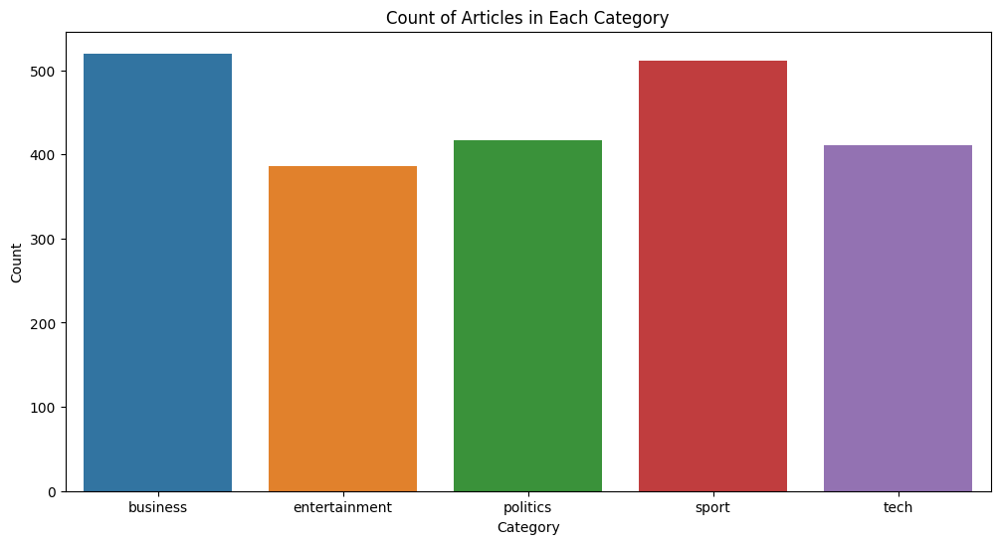

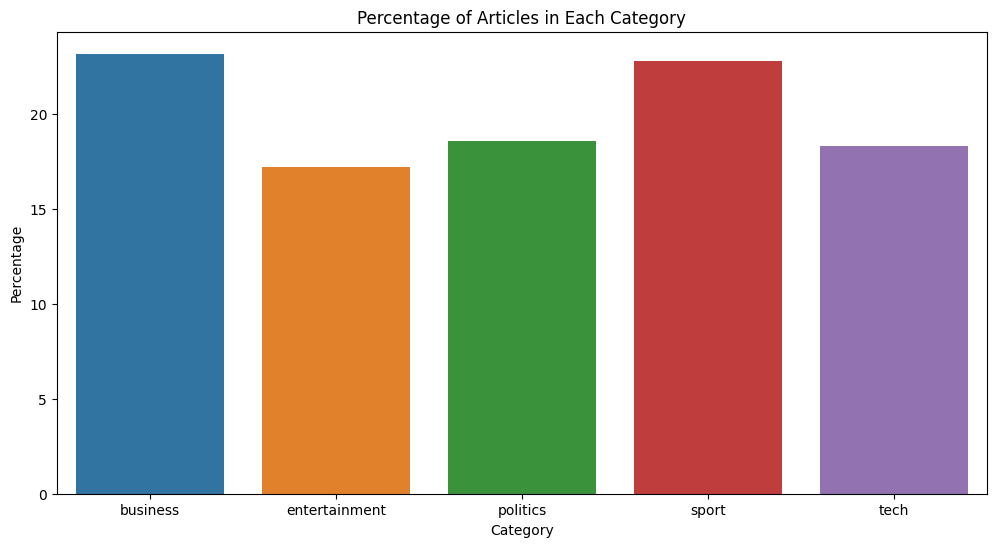

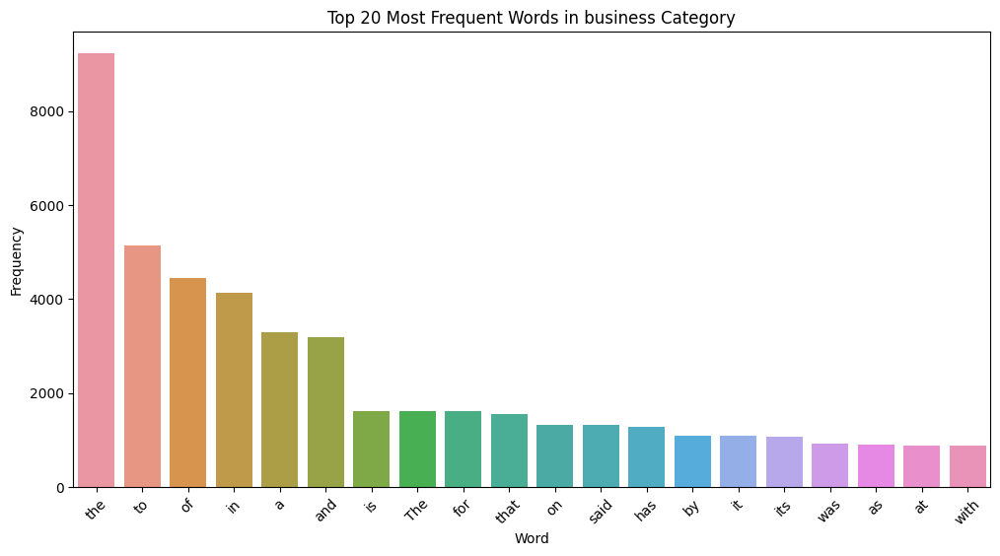


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Category: entertainment
Top 10 Most Frequent Words in entertainment Category:
  Word  Frequency
0  the       6456
1  and       2933
2   of       2926
3   to       2853
4   in       2643
5    a       2496
6  The       1699
7  for       1507
8  was       1129
9   on       1113


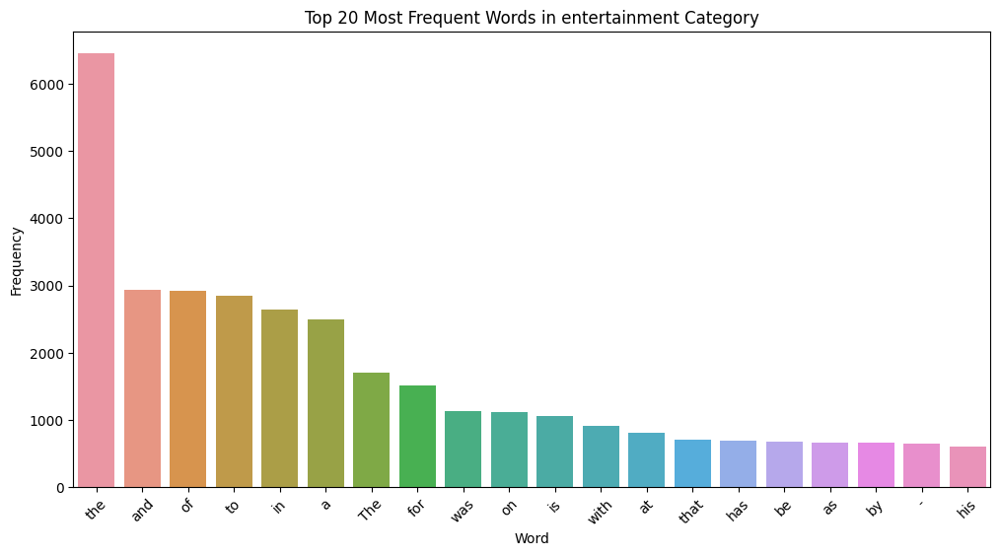


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Category: politics
Top 10 Most Frequent Words in politics Category:
   Word  Frequency
0   the      10569
1    to       5958
2    of       4449
3   and       3776
4     a       3659
5    in       3114
6   for       1859
7    is       1806
8  that       1761
9    on       1737


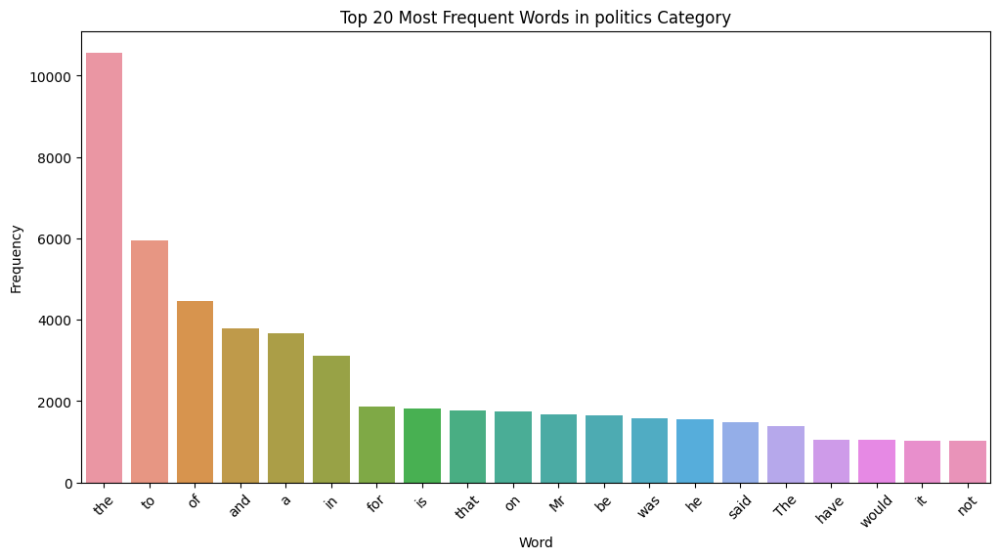


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Category: sport
Top 10 Most Frequent Words in sport Category:
  Word  Frequency
0  the       8651
1   to       4663
2    a       3673
3   in       3521
4  and       3446
5   of       2792
6  for       1711
7   is       1470
8   on       1432
9  was       1421


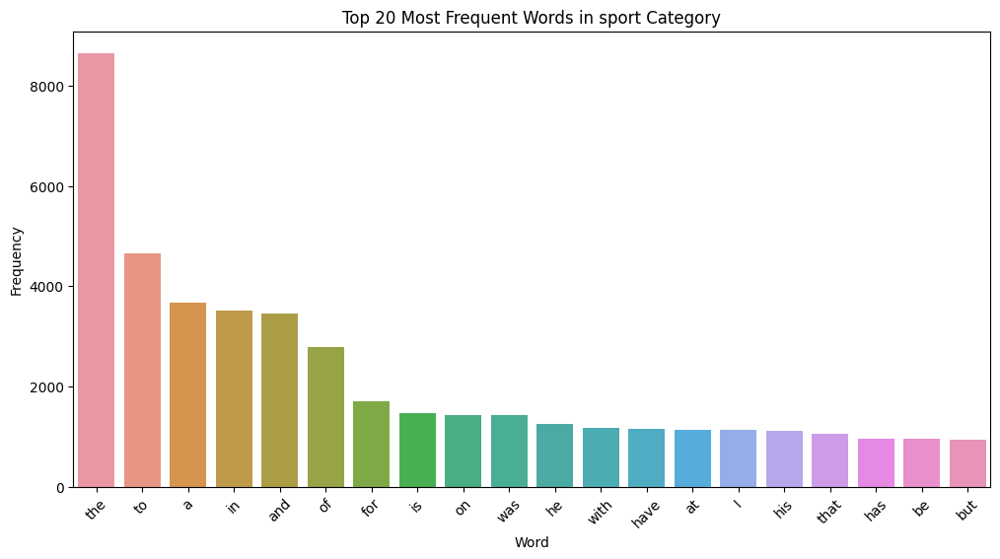


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Category: tech
Top 10 Most Frequent Words in tech Category:
   Word  Frequency
0   the       9958
1    to       6394
2    of       5418
3   and       4710
4     a       4151
5    in       3213
6    is       2549
7  that       2537
8   for       2045
9   The       1774


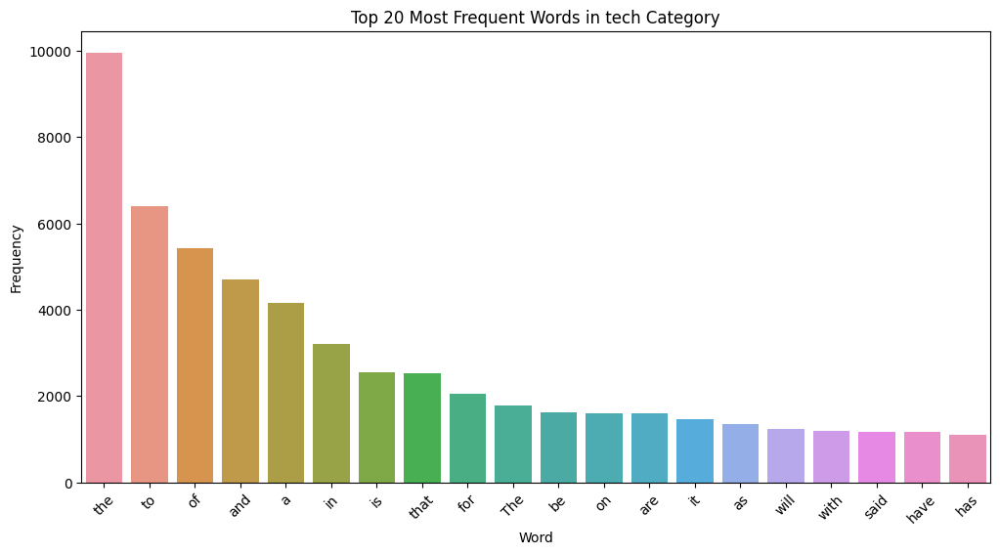


Interpretation:
The word frequency analysis reveals the most frequent terms in the news articles for this category.
Some common words may include generic terms related to the category, but specific keywords may also appear.
These keywords could provide insights into the main topics or subjects covered in the articles.

Word Cloud Visualization

Category: business


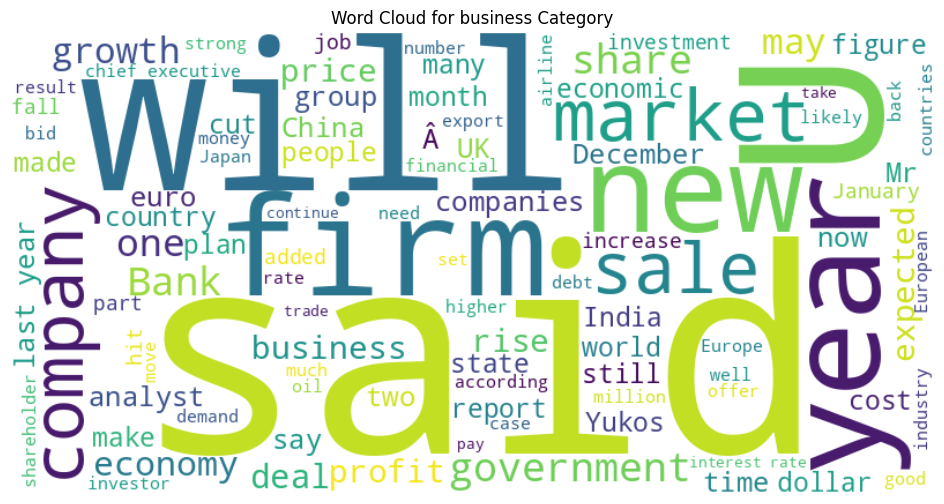


Category: entertainment


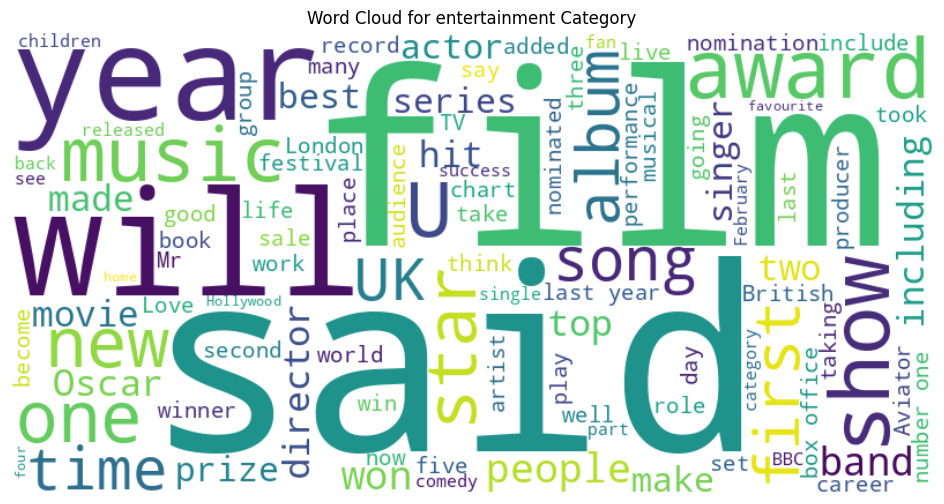


Category: politics


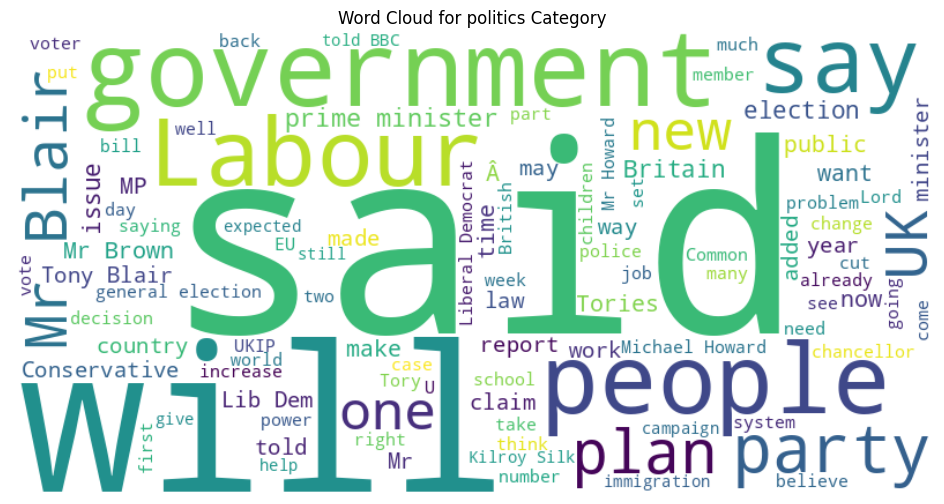


Category: sport


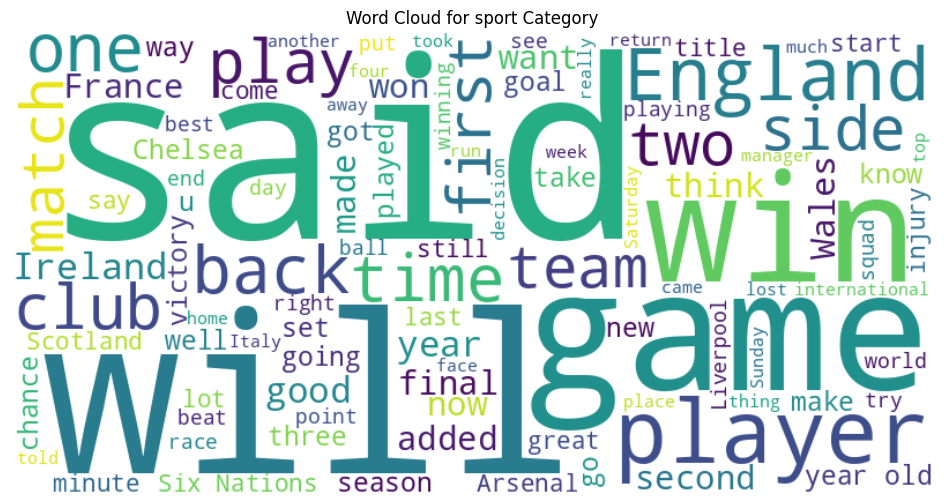


Category: tech


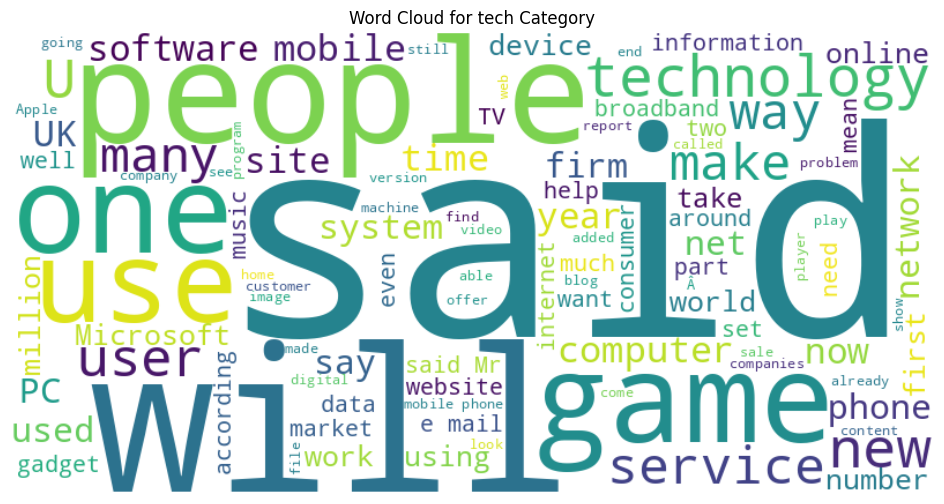

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from textblob import TextBlob  # For sentiment analysis

# Create a function for category analysis
def perform_category_analysis(category_data):
    num_documents = len(category_data)
    total_characters = sum(len(doc) for doc in category_data)
    average_characters = total_characters / num_documents
    return {
        "Num Documents": num_documents,
        "Total Characters": total_characters,
        "Average Characters per Document": average_characters,
    }

# Initialize a list to store all article data
all_articles = []

# Loop through each category.
for category in categories:
    category_data = []
    category_dir = os.path.join("/content/drive/MyDrive/data/Temp", category)

    file_list = os.listdir(category_dir)
    for file_name in file_list:
        with open(os.path.join(category_dir, file_name), 'r', encoding='iso-8859-1') as file:
            text = file.read()
            # Remove spaces between words
            text = ' '.join(text.split())  # This removes extra spaces
            category_data.append(text)

    # Store the category's data in the 'data' dictionary.
    data[category] = category_data

    # Store all article data for later use
    all_articles.extend(category_data)

    # Perform data exploration for the current category.
    exploration_results[category] = perform_category_analysis(category_data)

# Calculate the total number of articles
total_articles = len(all_articles)

# Task 2.1.1: Display the dataset's structure (first few rows)
print(" Displaying the dataset's structure (first few rows)")
for category, category_data in data.items():
    print(f"Category: {category}")
    for i, document in enumerate(category_data[:5]):
        print(f"Document {i + 1}: {document[:100]}...")  # Display the first 100 characters

# Task 2.1.2: Print column names and data types
print("\n Column names and data types")
for category, category_data in data.items():
    print(f"Category: {category}")
    df = pd.DataFrame({'Text': category_data})
    print(df.dtypes)
    print()

# Check for Missing Values:

# Task 2.1.3: Identify missing values and provide a summary
print("Identify missing values")
for category, category_data in data.items():
    print(f"Category: {category}")
    df = pd.DataFrame({'Text': category_data})
    missing_values = df.isnull().sum()
    print(missing_values)
    print()


# Task 2.1.4: Compute summary statistics for text lengths
print("Task 2.1.4: Summary Statistics for Text Lengths")
for category, category_data in data.items():
    print(f"Category: {category}")
    df = pd.DataFrame({'Text': category_data})
    df['Text Length'] = df['Text'].apply(len)
    summary_stats = df['Text Length'].describe(percentiles=[.25, .75])
    print(summary_stats[['count', 'mean', 'std', 'min', 'max']])
    print()

# Categorical Analysis
print("Categorical Analysis")

# Calculate the category counts
category_counts = [len(category_data) for category_data in data.values()]

# Task 2.2.1: Category Distribution Visualization (Count)
plt.figure(figsize=(12, 6))
sns.barplot(x=categories, y=category_counts)
plt.title('Count of Articles in Each Category')
plt.xlabel('Category')
plt.ylabel('Count')

# Calculate and display the category percentages
category_percentages = [(category, len(category_data) / total_articles * 100) for category, category_data in data.items()]

print("Category Percentages:")
for category, percentage in category_percentages:
    print(f"{category}: {percentage:.2f}%")

# Task 2.2.2: Category Distribution Visualization (Percentage)
plt.figure(figsize=(12, 6))
sns.barplot(x=categories, y=[percentage for _, percentage in category_percentages])
plt.title('Percentage of Articles in Each Category')
plt.xlabel('Category')
plt.ylabel('Percentage')

# Task 2.3.2: Sentiment Analysis
print("\nSentiment Analysis")
for category, category_data in data.items():
    print(f"\nCategory: {category}")
    sentiment_scores = [TextBlob(doc).sentiment.polarity for doc in category_data]

    # Determine sentiment labels based on polarity
    sentiment_labels = ['Positive' if score > 0 else 'Negative' if score < 0 else 'Neutral' for score in sentiment_scores]

    # Create a DataFrame to store sentiment analysis results
    sentiment_df = pd.DataFrame({'Sentiment Score': sentiment_scores, 'Sentiment Label': sentiment_labels})

    # Display sentiment scores and labels
    print(sentiment_df)


# Task 2.4.1: Word Frequency Calculation and Visualization
print("\nWord Frequency Analysis and Visualization")
for category, category_data in data.items():
    print(f"\nCategory: {category}")
    # Combine all documents in the category into a single text corpus
    category_corpus = ' '.join(category_data)

    # Tokenize the text into words
    words = category_corpus.split()

    # Calculate word frequencies
    word_frequencies = pd.Series(words).value_counts().reset_index()
    word_frequencies.columns = ['Word', 'Frequency']

    # Display the top 10 most frequent words in the category
    print(f"Top 10 Most Frequent Words in {category} Category:")
    print(word_frequencies.head(10))

    # Visualize the word frequency distribution for the top 20 words
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Word', y='Frequency', data=word_frequencies.head(20))
    plt.title(f'Top 20 Most Frequent Words in {category} Category')
    plt.xlabel('Word')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

    # Interpretation
    print("\nInterpretation:")
    print("The word frequency analysis reveals the most frequent terms in the news articles for this category.")
    print("Some common words may include generic terms related to the category, but specific keywords may also appear.")
    print("These keywords could provide insights into the main topics or subjects covered in the articles.")

# Task 2.4.2: Word Cloud Visualization
print("\nWord Cloud Visualization")
for category, category_data in data.items():
    print(f"\nCategory: {category}")
    # Combine all documents in the category into a single text corpus
    category_corpus = ' '.join(category_data)

    # Generate a word cloud from the text corpus
    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(category_corpus)

    # Display the word cloud
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {category} Category')
    plt.axis('off')
    plt.show()

### **Category Distribution Visualization**

Text(0, 0.5, 'Percentage')

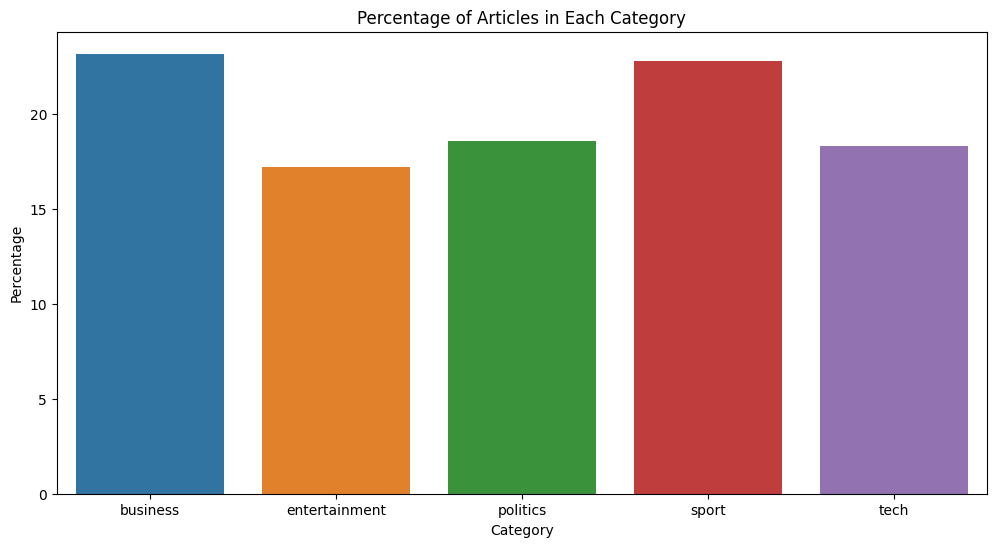

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x=categories, y=[percentage for _, percentage in category_percentages])
plt.title('Percentage of Articles in Each Category')
plt.xlabel('Category')
plt.ylabel('Percentage')

### **Sentiment Analysis**

In [ ]:
for category, category_data in data.items():
    print(f"\nCategory: {category}")
    sentiment_scores = [TextBlob(doc).sentiment.polarity for doc in category_data]

    # Determine sentiment labels based on polarity
    sentiment_labels = ['Positive' if score > 0 else 'Negative' if score < 0 else 'Neutral' for score in sentiment_scores]

    # Create a DataFrame to store sentiment analysis results
    sentiment_df = pd.DataFrame({'Sentiment Score': sentiment_scores, 'Sentiment Label': sentiment_labels})

    # Display sentiment scores and labels
    print(sentiment_df)


Category: business
     Sentiment Score Sentiment Label
0           0.021364        Positive
1           0.181667        Positive
2           0.120539        Positive
3           0.154389        Positive
4          -0.053687        Negative
..               ...             ...
515         0.090127        Positive
516         0.115792        Positive
517        -0.053680        Negative
518         0.117682        Positive
519        -0.003889        Negative

[520 rows x 2 columns]

Category: entertainment
     Sentiment Score Sentiment Label
0           0.135726        Positive
1           0.170417        Positive
2          -0.046919        Negative
3           0.153333        Positive
4          -0.042524        Negative
..               ...             ...
381         0.069234        Positive
382         0.049837        Positive
383         0.113769        Positive
384         0.118994        Positive
385         0.106190        Positive

[386 rows x 2 columns]

Category: politics

### **Word Frequency Calculation and Visualization**


Category: business
Top 10 Most Frequent Words in business Category:
   Word  Frequency
0   the       9229
1    to       5145
2    of       4454
3    in       4126
4     a       3300
5   and       3187
6    is       1623
7   The       1612
8   for       1604
9  that       1547


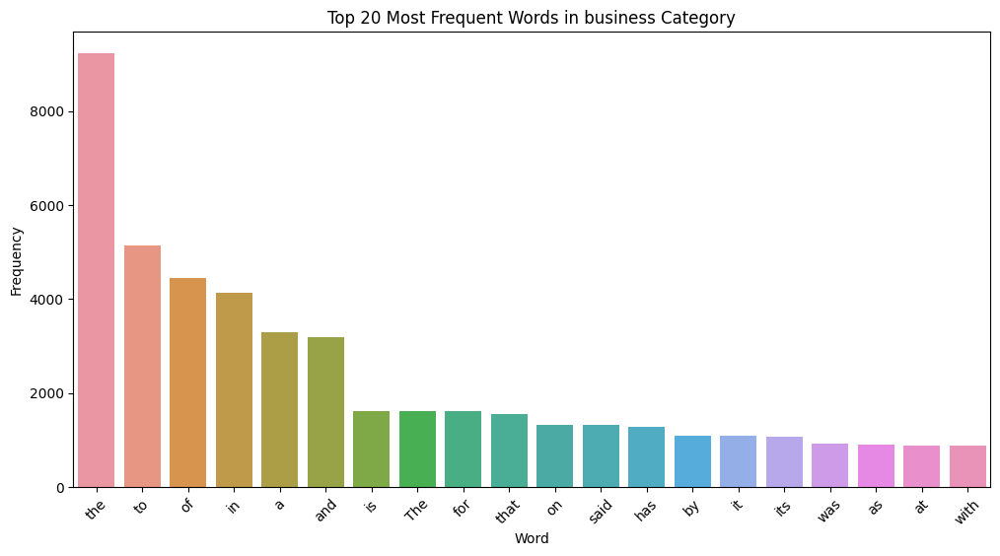


Category: entertainment
Top 10 Most Frequent Words in entertainment Category:
  Word  Frequency
0  the       6456
1  and       2933
2   of       2926
3   to       2853
4   in       2643
5    a       2496
6  The       1699
7  for       1507
8  was       1129
9   on       1113


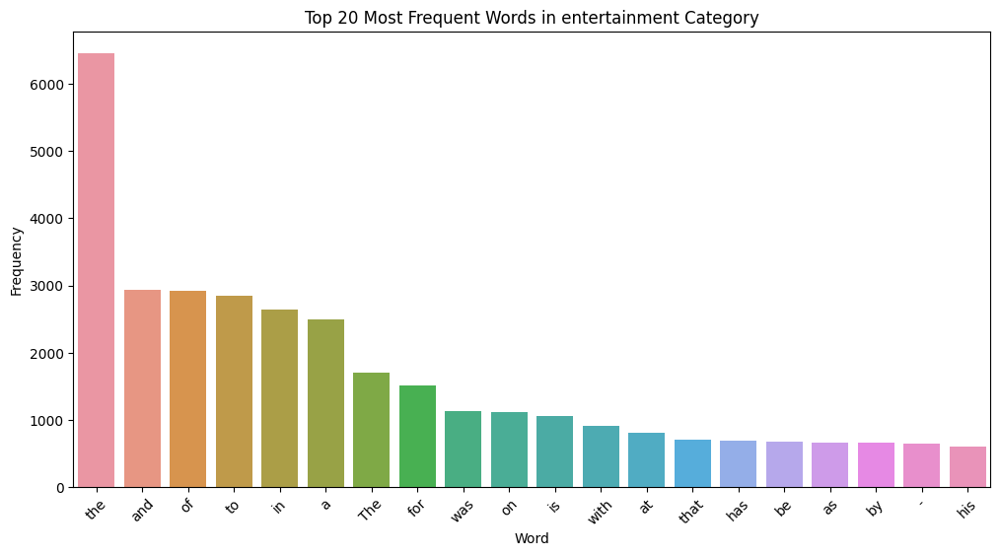


Category: politics
Top 10 Most Frequent Words in politics Category:
   Word  Frequency
0   the      10569
1    to       5958
2    of       4449
3   and       3776
4     a       3659
5    in       3114
6   for       1859
7    is       1806
8  that       1761
9    on       1737


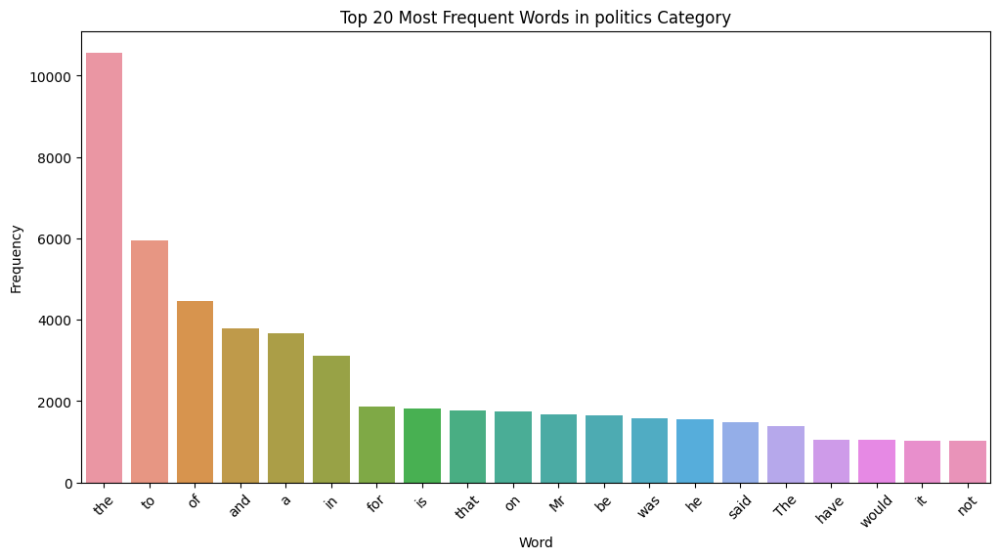


Category: sport
Top 10 Most Frequent Words in sport Category:
  Word  Frequency
0  the       8651
1   to       4663
2    a       3673
3   in       3521
4  and       3446
5   of       2792
6  for       1711
7   is       1470
8   on       1432
9  was       1421


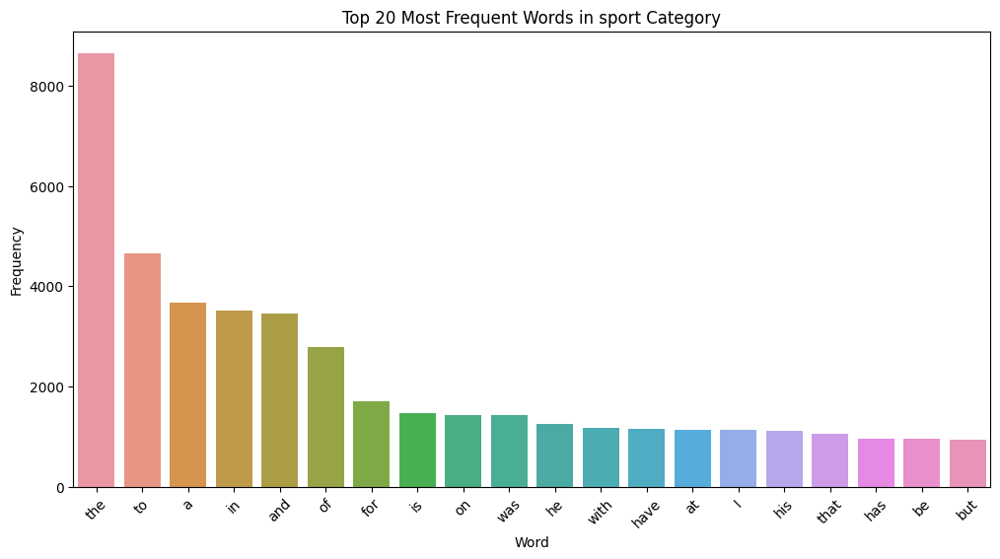


Category: tech
Top 10 Most Frequent Words in tech Category:
   Word  Frequency
0   the       9958
1    to       6394
2    of       5418
3   and       4710
4     a       4151
5    in       3213
6    is       2549
7  that       2537
8   for       2045
9   The       1774


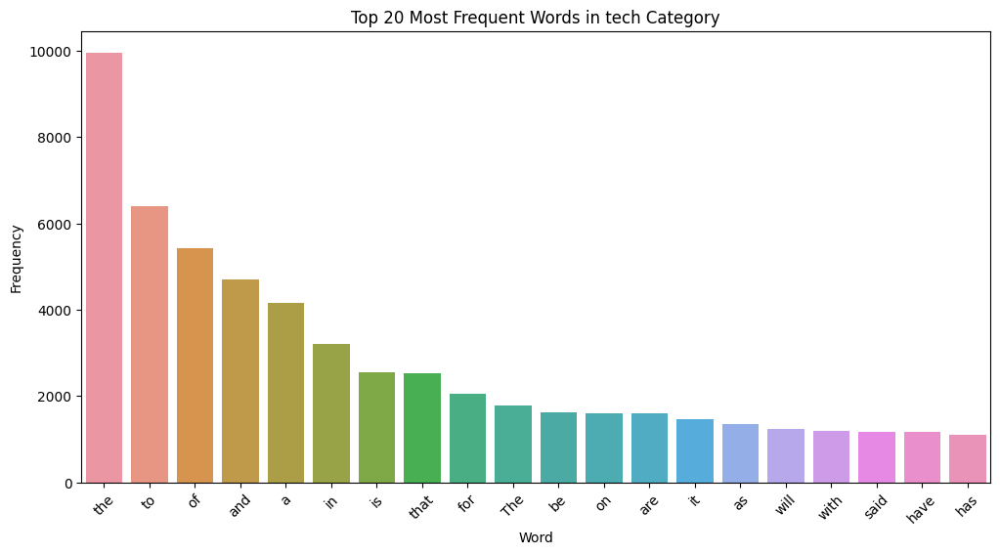

In [ ]:
for category, category_data in data.items():
    print(f"\nCategory: {category}")
    # Combine all documents in the category into a single text corpus
    category_corpus = ' '.join(category_data)

    # Tokenize the text into words
    words = category_corpus.split()

    # Calculate word frequencies
    word_frequencies = pd.Series(words).value_counts().reset_index()
    word_frequencies.columns = ['Word', 'Frequency']

    # Display the top 10 most frequent words in the category
    print(f"Top 10 Most Frequent Words in {category} Category:")
    print(word_frequencies.head(10))


    plt.figure(figsize=(12, 6))
    sns.barplot(x='Word', y='Frequency', data=word_frequencies.head(20))
    plt.title(f'Top 20 Most Frequent Words in {category} Category')
    plt.xlabel('Word')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

### **Word Cloud Visualization**


Category: business


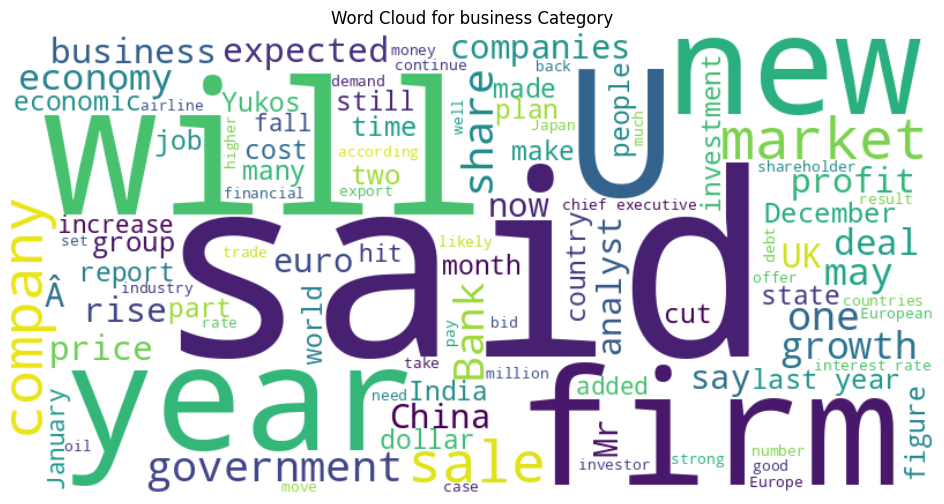


Category: entertainment


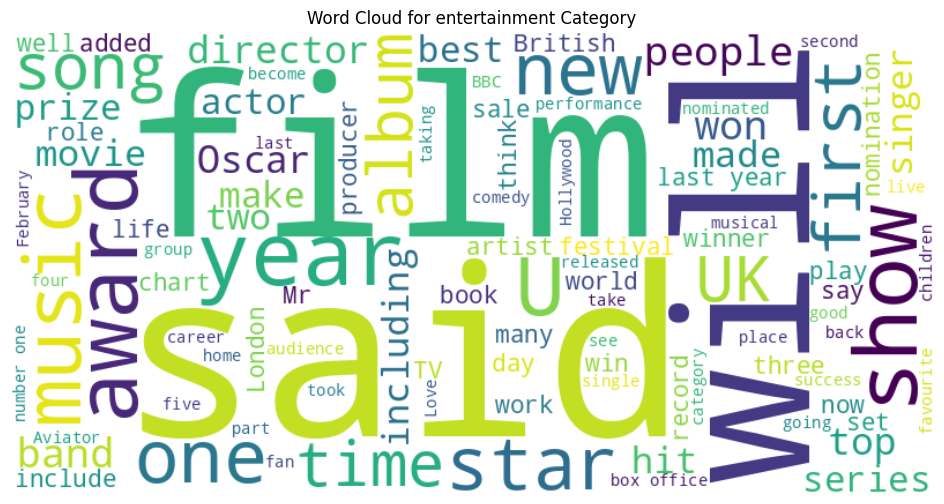


Category: politics


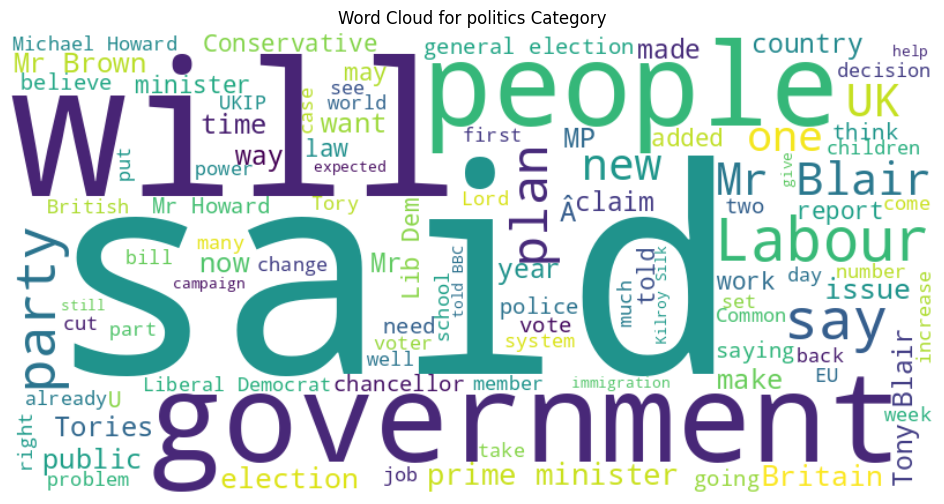


Category: sport


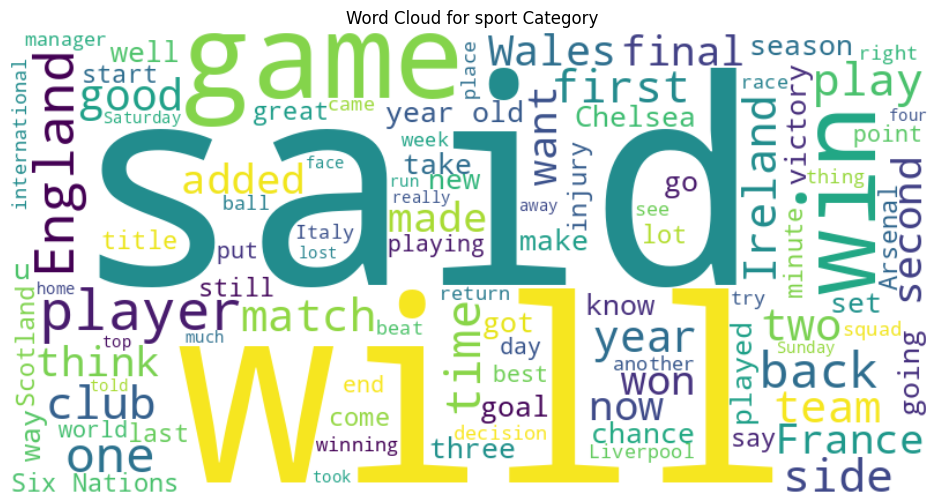


Category: tech


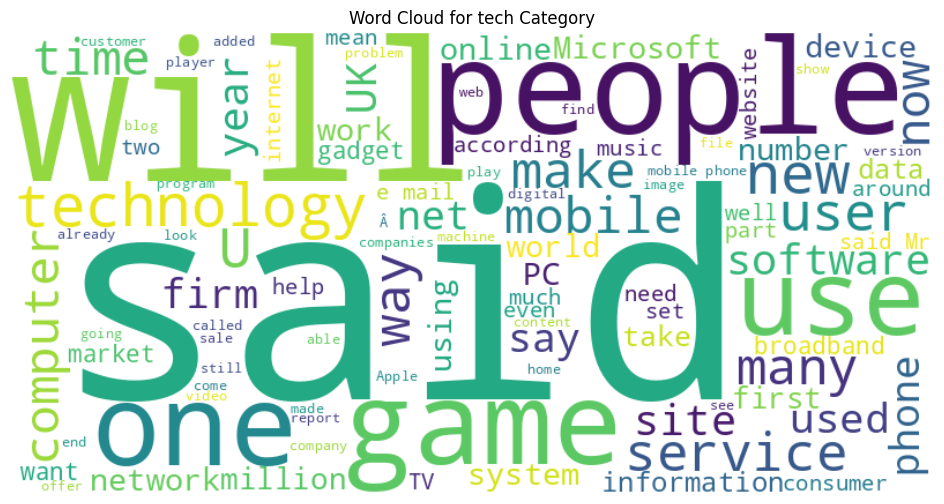

In [ ]:
for category, category_data in data.items():
    print(f"\nCategory: {category}")
    # Combine all documents in the category into a single text corpus
    category_corpus = ' '.join(category_data)

    # Generate a word cloud from the text corpus
    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate(category_corpus)

    # Display the word cloud
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {category} Category')
    plt.axis('off')
    plt.show()

#**Bhaskar Workspace**

In [ ]:
import pandas as pd
import numpy as np
import nltk

**Tokenization**

In [ ]:
from nltk.tokenize import word_tokenize

In [ ]:
def tokens(text):
    tokenization=word_tokenize(text)
    return ' '.join(i for i in tokenization)

**Punctuation Removing**

In [ ]:
import string

In [ ]:
def punctuation_removal(text):
    return ''.join(word for word in text if word not in string.punctuation)

**Removing Stop words**

In [ ]:
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
#view stopwords in 'english' language
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [ ]:
def stop(text):
    stop_word=stopwords.words('english')
    without_stopwords=[]
    for i in text.split():
        if i not in stop_word:
            without_stopwords.append(i)
    return ' '.join(i for i in without_stopwords)

**Performing pre-processing on our data**

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
#Accessing the each file from the dictionary
for value in data.values():
    cleaned_data=[]
    for text in value:
        # Removing punctuation and converting into lowercase
        punct=punctuation_removal(text.lower())
        # removing stopwords
        new_words=stop(punct)
        # tokenization and adding result to the list
        cleaned_data.append(tokens(new_words))
cleaned_data

['telewest challenge sky plus cable firm telewest offer personal video recorder pvr set top box challenge sky plus sky plus market leader field digital video recorders uk 474000 subscribers pvrs record tv programmes hard drive letting viewers pause rewind live television effectively time shift viewing experience number pvrs incorporating freeview digital terrestrial tv also market success limited telewests pvr offer 160gb hard drive storage 80 hours programmes box three tuners means viewers record two channels simultaneously watching third channel sky plus boxes come two versions 20gb version â£99 160gb version â£399 sky also charges â£10 subscription fee service unless viewers subscription one premium packages telewest yet reveal pricing new box charging subscription fee service eric tveter president chief operating officer telewest broadband said make pvr settop box available later year putting stop missed soaps interrupted films arguments programmes record pvrs recordable dvd player

**Stemming**

In [ ]:
from nltk.stem import LancasterStemmer

In [ ]:
# initializing the LancasterStemmer class
stemmer=LancasterStemmer()

#create a function for stemming
def st(text):
    stemmed_words=[stemmer.stem(word) for word in text.split(' ')]
    return ' '.join(i for i in stemmed_words)

#create a new list to store the stemmed words
result_text=[]
for word in cleaned_data:
    result_text.append(st(word))
result_text

['telewest challeng sky plu cabl firm telewest off person video record pvr set top box challeng sky plu sky plu market lead field digit video record uk 474000 subscrib pvrs record tv program hard driv let view paus rewind liv televid effect tim shift view expery numb pvrs incorp freeview digit terrest tv also market success limit telewest pvr off 160gb hard driv stor 80 hour program box three tun mean view record two channel simult watch third channel sky plu box com two vert 20gb vert â£99 160gb vert â£399 sky also charg â£10 subscrib fee serv unless view subscrib on prem pack telewest yet rev pric new box charg subscrib fee serv er tvet presid chief op off telewest broadband said mak pvr settop box avail lat year put stop miss soap interrupt film argu program record pvrs record dvd play set replac video record standard method record sav favourit tv program last year high street retail dixon said going stop sel vhs machin favo pvrs record dvd machin sky said aim 25 subscrib us sky plu

# **Vectorization**

**Tfidf-Vectorizer**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
#initializing the Tfidf-Vectorizer Class
vectorizer=TfidfVectorizer(lowercase=True,stop_words='english',max_features=100)

# fit and transform the data into the vectorizer
tfidf_matrix=vectorizer.fit_transform(result_text)
#convert matrix into array
tfidf_array=tfidf_matrix.toarray()

#convert array into
tfidf_dataframe=pd.DataFrame(tfidf_array)
tfidf_dataframe

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.138018,0.000000,...,0.103151,0.326459,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.152600
1,0.055960,0.030303,0.027195,0.000000,0.000000,0.038736,0.029034,0.000000,0.000000,0.000000,...,0.000000,0.113565,0.024851,0.043154,0.031711,0.000000,0.028184,0.067011,0.000000,0.019907
2,0.162978,0.176511,0.000000,0.000000,0.075509,0.000000,0.000000,0.000000,0.000000,0.475214,...,0.078380,0.082687,0.000000,0.000000,0.000000,0.000000,0.082083,0.000000,0.148061,0.057977
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125413,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.096159,0.000000,0.000000,0.000000,0.000000,0.000000,0.199564,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.085407,0.000000,0.000000,0.000000,0.000000,0.153532,0.087358,0.342071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406,0.047947,0.000000,0.000000,0.000000,0.044428,0.000000,0.049754,0.000000,0.000000,0.000000,...,0.092235,0.000000,0.042586,0.036975,0.000000,0.084901,0.000000,0.038277,0.000000,0.034113
407,0.087102,0.000000,0.000000,0.163597,0.000000,0.000000,0.000000,0.000000,0.000000,0.084658,...,0.167556,0.000000,0.154725,0.000000,0.000000,0.077116,0.000000,0.000000,0.000000,0.000000
408,0.082390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.073177,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.117236
409,0.048993,0.000000,0.000000,0.000000,0.090794,0.067827,0.000000,0.085572,0.000000,0.095235,...,0.000000,0.000000,0.174057,0.151124,0.055526,0.000000,0.000000,0.078224,0.044508,0.034857


**CountVectorizer**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
# intializing the Countvectorizer
cv=CountVectorizer(max_features=20)

#fit the data into the vectorizer
matrix=cv.fit_transform(result_text)

#converting the matrix into an array
array=matrix.toarray()

#converting array into dataframe
countvect_dataframe=pd.DataFrame(array)
countvect_dataframe

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,2,0,0,0,0,0,1,0,0,1,1,0,0,1,3,2,0,1,0,2
1,4,0,0,2,3,6,2,18,0,1,1,6,5,3,7,15,1,3,0,1
2,1,0,0,0,0,0,4,3,0,0,0,2,3,0,0,5,0,11,1,1
3,1,0,0,0,0,0,1,0,0,0,0,1,0,0,5,0,0,6,1,0
4,1,1,2,1,3,1,4,1,4,0,3,0,2,0,3,1,0,5,3,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406,1,0,1,0,6,0,1,7,5,7,0,4,6,0,14,8,0,5,0,1
407,0,2,0,0,0,0,1,0,0,3,0,2,3,0,3,4,0,9,1,0
408,1,1,0,6,0,0,0,0,0,1,0,0,0,1,3,0,0,4,0,2
409,1,2,3,0,1,7,6,0,0,3,4,10,0,4,0,0,1,2,0,1


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pandas as pd

# Sample list of text documents (replace with your data)
result_text = [
    "Your first text document here",
    "Your second text document here",
    # Add more text documents as needed
]

# Initialize the Tfidf-Vectorizer Class
vectorizer = TfidfVectorizer(lowercase=True, stop_words='english', max_features=100)

# Fit and transform the data into the vectorizer
tfidf_matrix = vectorizer.fit_transform(result_text)

# Convert matrix into an array
tfidf_array = tfidf_matrix.toarray()

# Convert the array into a DataFrame
tfidf_dataframe = pd.DataFrame(tfidf_array)

# Now, let's perform LDA on the TF-IDF data
num_topics = 5  # You can adjust the number of topics as needed
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda_matrix = lda.fit_transform(tfidf_matrix)

# Add the LDA topic proportions to the DataFrame
for i in range(num_topics):
    tfidf_dataframe[f"Topic {i + 1}"] = lda_matrix[:, i]

# Remove columns "0," "1," and "2" from the DataFrame
columns_to_remove = [0, 1, 2]
tfidf_dataframe = tfidf_dataframe.drop(columns=columns_to_remove)

# Display the updated DataFrame with TF-IDF and LDA topics, without columns "0," "1," and "2"
print(tfidf_dataframe)

    Topic 1   Topic 2   Topic 3   Topic 4   Topic 5
0  0.667784  0.083054  0.083054  0.083054  0.083054
1  0.703542  0.074114  0.074114  0.074114  0.074114
